In [ ]:
# Importing libraries
import torchvision.models as models
from torch import nn
import time

class Extractor():

    def __init__(self, model_children, DS_layer_name='downsample'):
        self.model_children = model_children
        self.DS_layer_name = DS_layer_name

        self.CNN_layers = []
        self.Linear_layers = []
        self.DS_layers = []

        self.CNN_weights = []
        self.Linear_weights = []

        self.__no_sq_layers = 0  # number of sequential layers
        self.__no_containers = 0  # number of containers

        self.__verbose = []

        self.__bottleneck = models.resnet.Bottleneck
        self.__basicblock = models.resnet.BasicBlock

    def __Append(self, layer, Linear=False):
        """
        This function will append the layers weights and
        the layer itself to the appropriate variables

        params: layer: takes in CNN or Linear layer
        returns: None
        """

        if Linear:
            self.Linear_weights.append(layer.weight)
            self.Linear_layers.append(layer)

        else:
            self.CNN_weights.append(layer.weight)
            self.CNN_layers.append(layer)

    def __Layer_Extractor(self, layers):
        """
        This function(algorithm) finds CNN and linear layer in a Sequential layer

        params: layers: takes in either CNN or Sequential or linear layer
        return: None
        """

        for x in range(len(layers)):

            if type(layers[x]) == nn.Sequential:
                # Calling the fn to loop through the layer to get CNN layer
                self.__Layer_Extractor(layers[x])
                self.__no_sq_layers += 1

            if type(layers[x]) == nn.Conv2d:
                self.__Append(layers[x])

            if type(layers[x]) == nn.Linear:
                self.__Append(layers[x], True)

            # This statement makes sure to get the down-sampling layer in the model
            if self.DS_layer_name in layers[x]._modules.keys():
                self.DS_layers.append(layers[x]._modules[self.DS_layer_name])

            # The below statement will loop throgh the containers and append it
            if isinstance(layers[x], (self.__bottleneck, self.__basicblock)):
                self.__no_containers += 1
                for child in layers[x].children():
                    if type(child) == nn.Conv2d:
                        self.__Append(child)

    def __Verbose(self):

        for cnn_l, cnn_wts in zip(self.CNN_layers, self.CNN_weights):
            self.__verbose.append(f"CNN Layer : {cnn_l} ---> Weights shape :\
 {cnn_wts.shape}")

        for linear_l, linear_wts in zip(self.Linear_layers, self.Linear_weights):
            self.__verbose.append(f"Linear Layer : {linear_l}  --->\
 Weights shape : {linear_wts.shape}")

    def activate(self):
        """Activates the algorithm"""

        start = time.time()
        self.__Layer_Extractor(self.model_children)
        self.__Verbose()
        self.__ex_time = str(round(time.time() - start, 5)) + ' sec'

    def info(self):
        """Information"""

        return {
            'Down-sample layers name': self.DS_layer_name,
            'Total CNN Layers': len(self.CNN_layers),
            'Total Sequential Layers': self.__no_sq_layers,
            'Total Downsampling Layers': len(self.DS_layers),
            'Total Linear Layers': len(self.Linear_layers),
            'Total number of Bottleneck and Basicblock': self.__no_containers,
            'Total Execution time': self.__ex_time
        }

    def __repr__(self):
        return '\n'.join(self.__verbose)

    def __str__(self):
        return '\n'.join(self.__verbose)

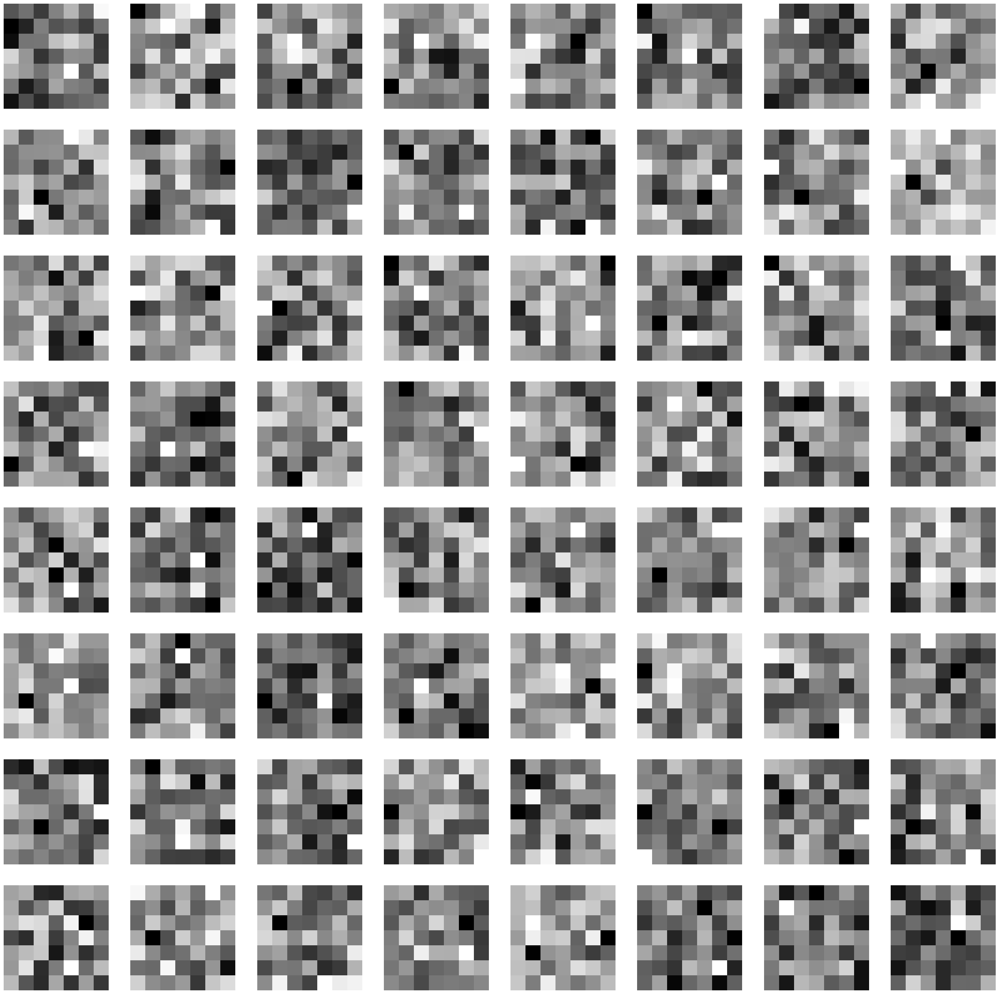

<ipython-input-3-843dd1c41bb8>:49: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(30, 30))


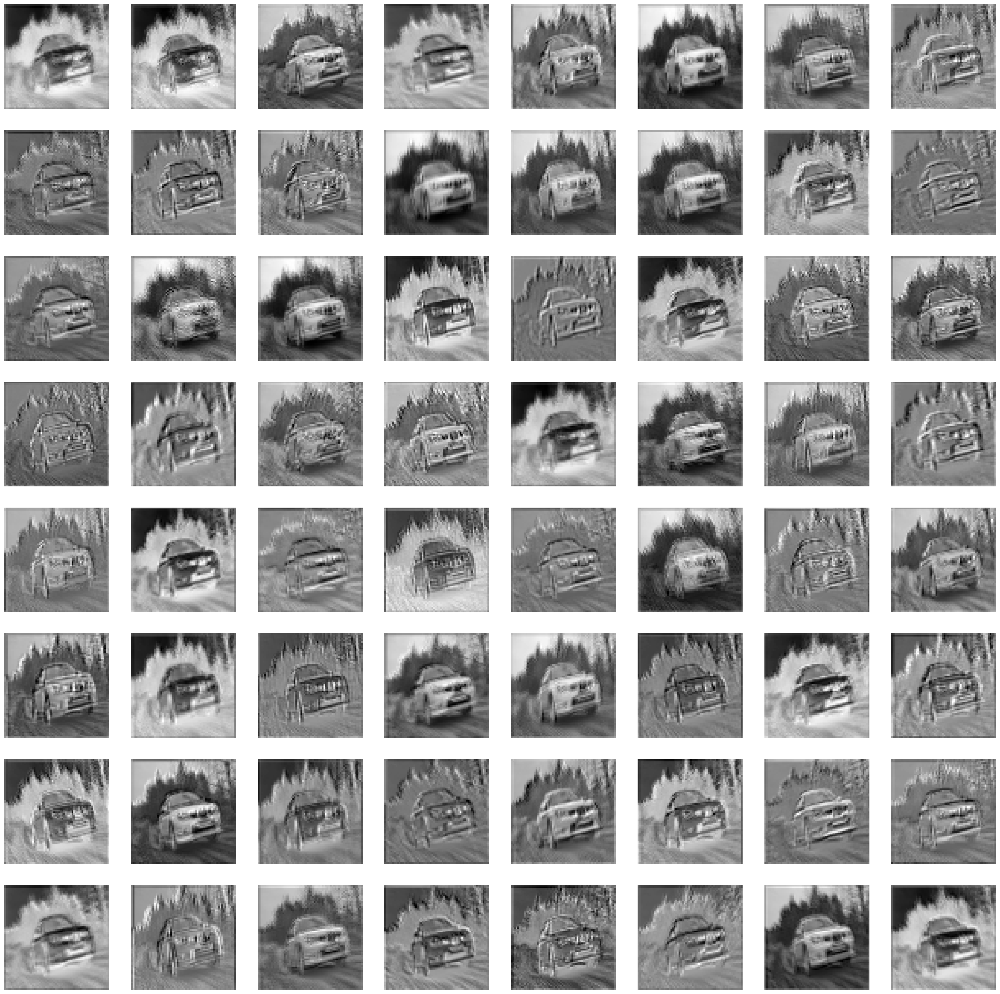

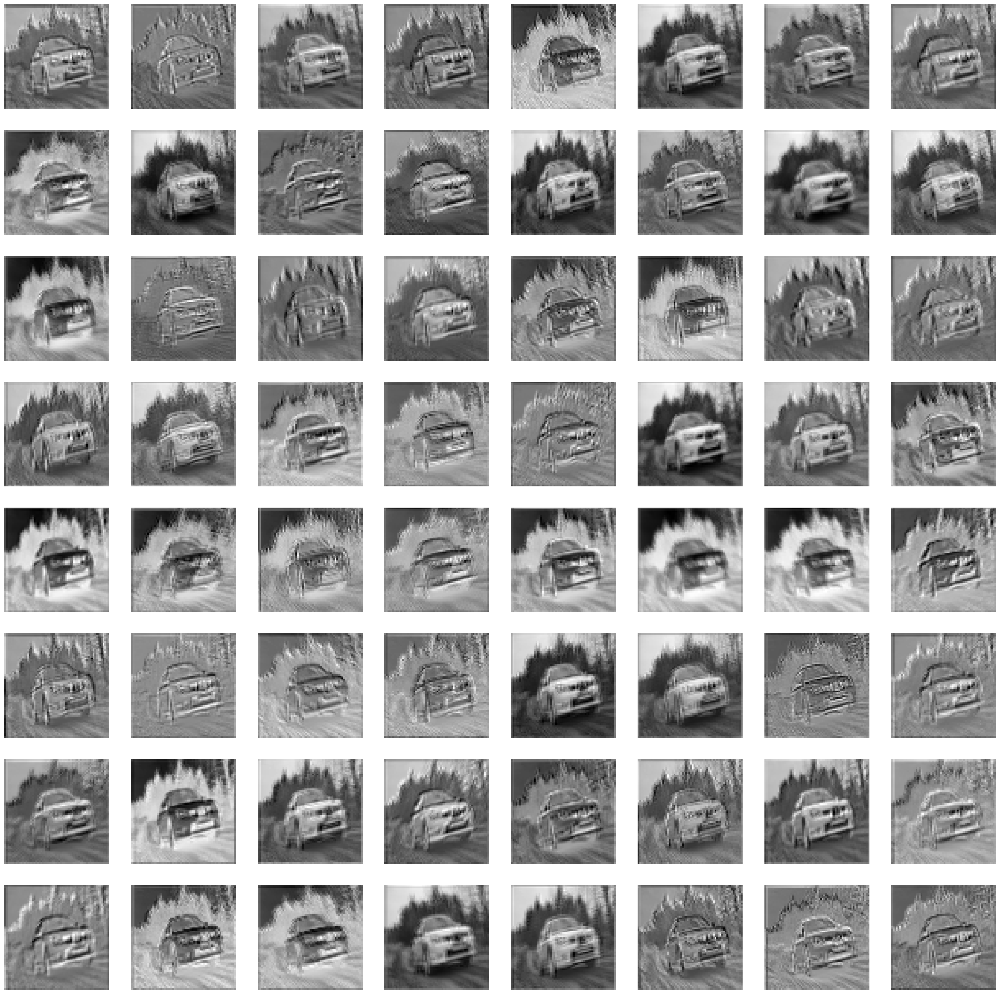

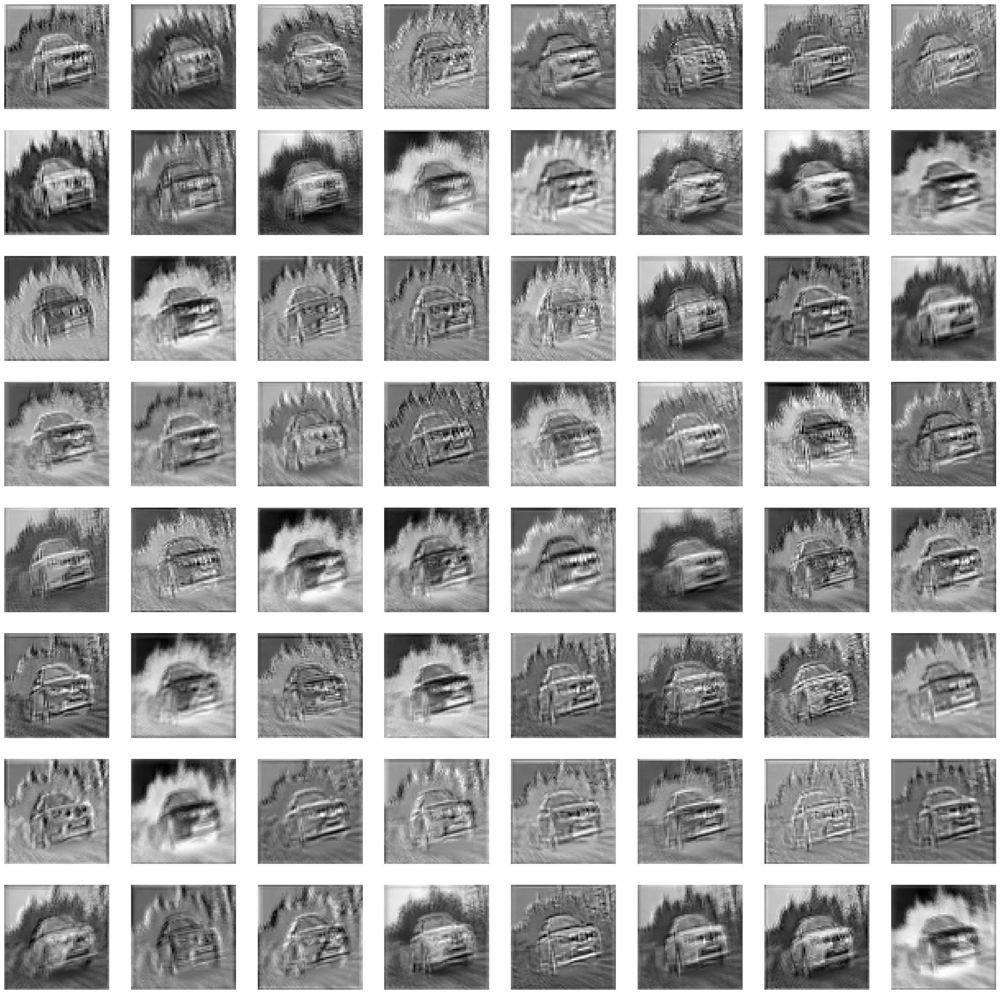

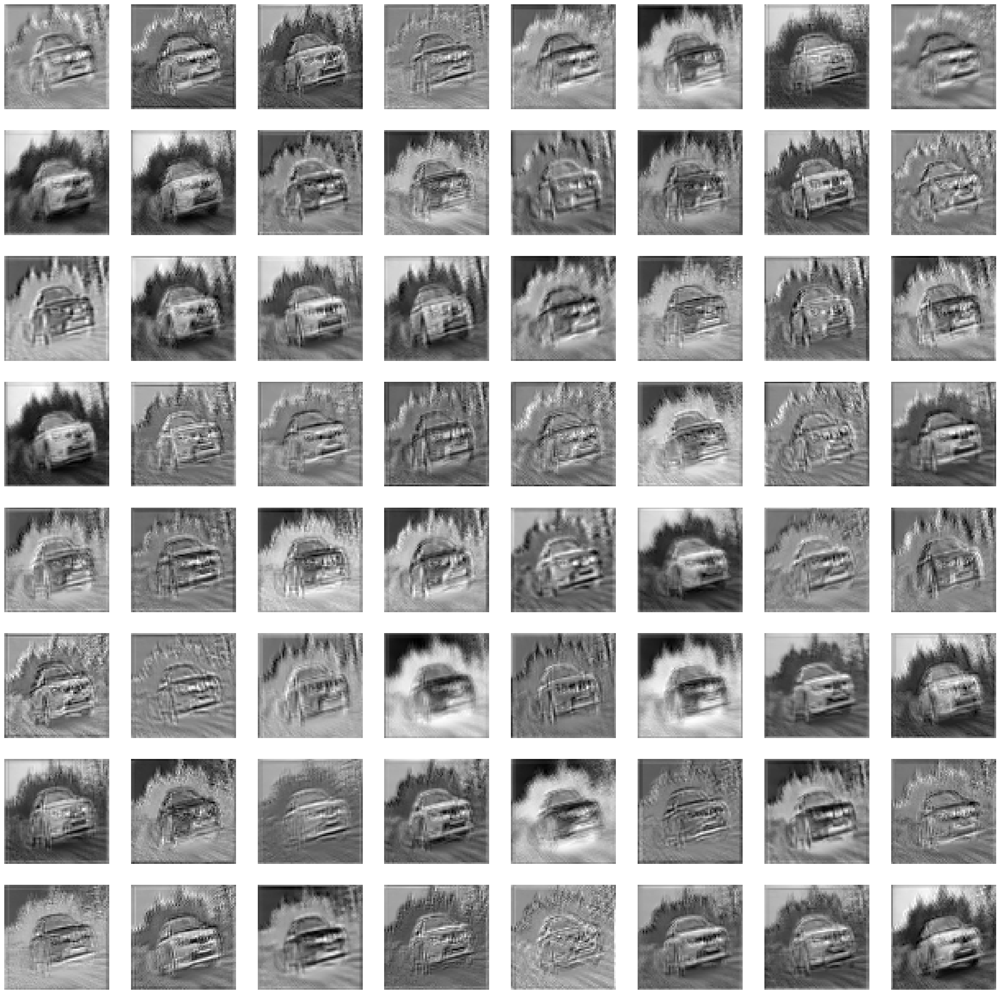

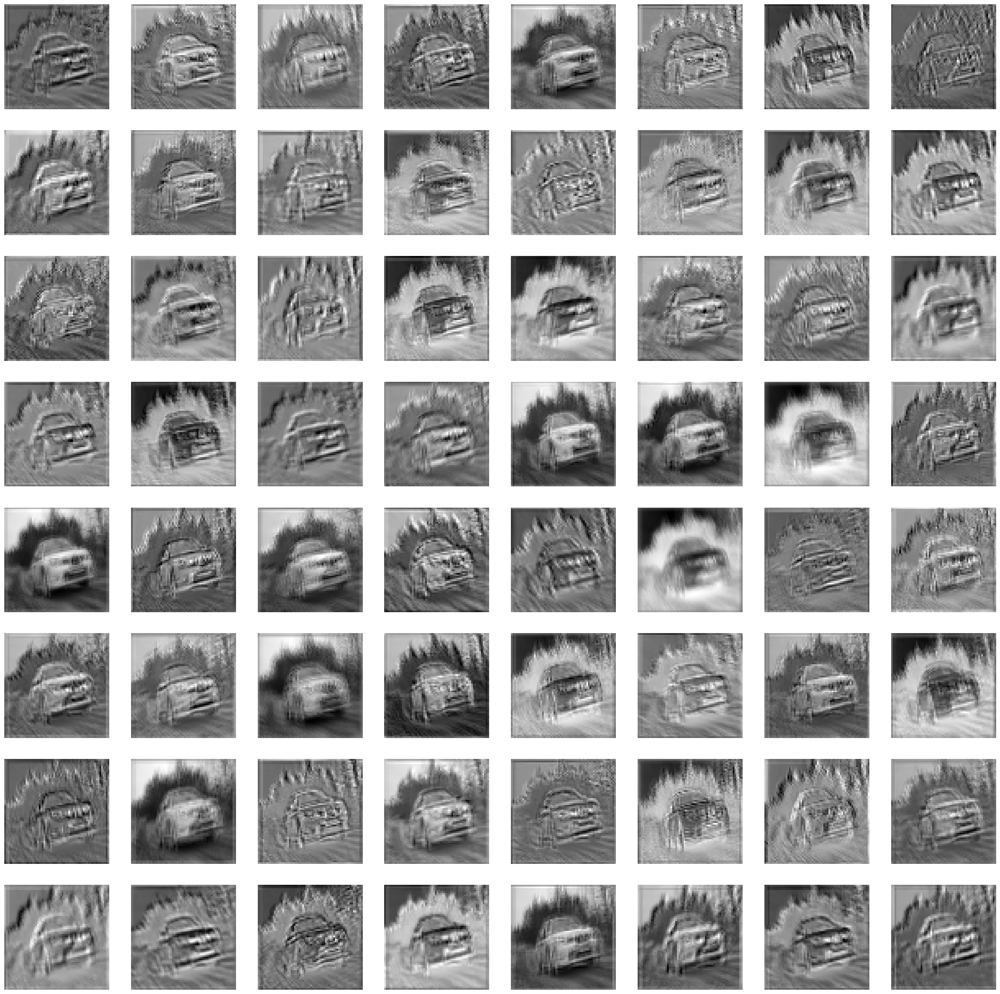

...

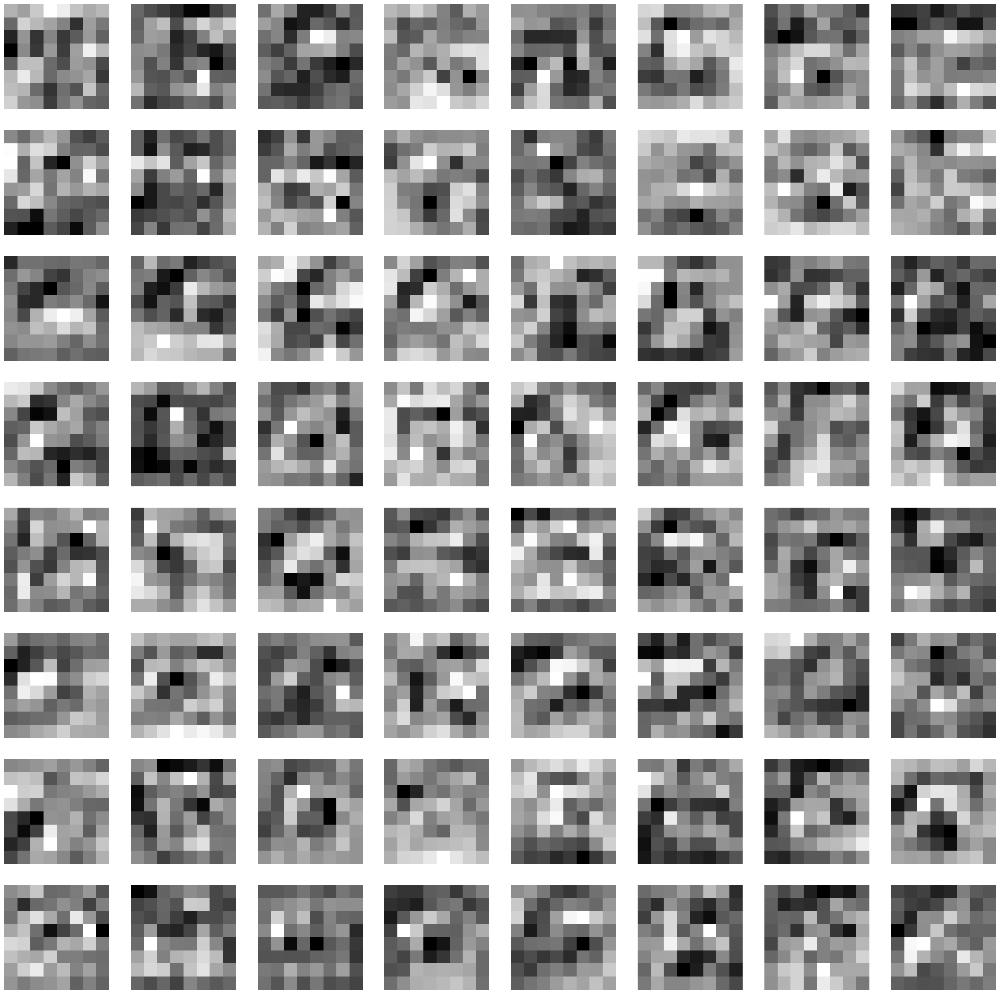

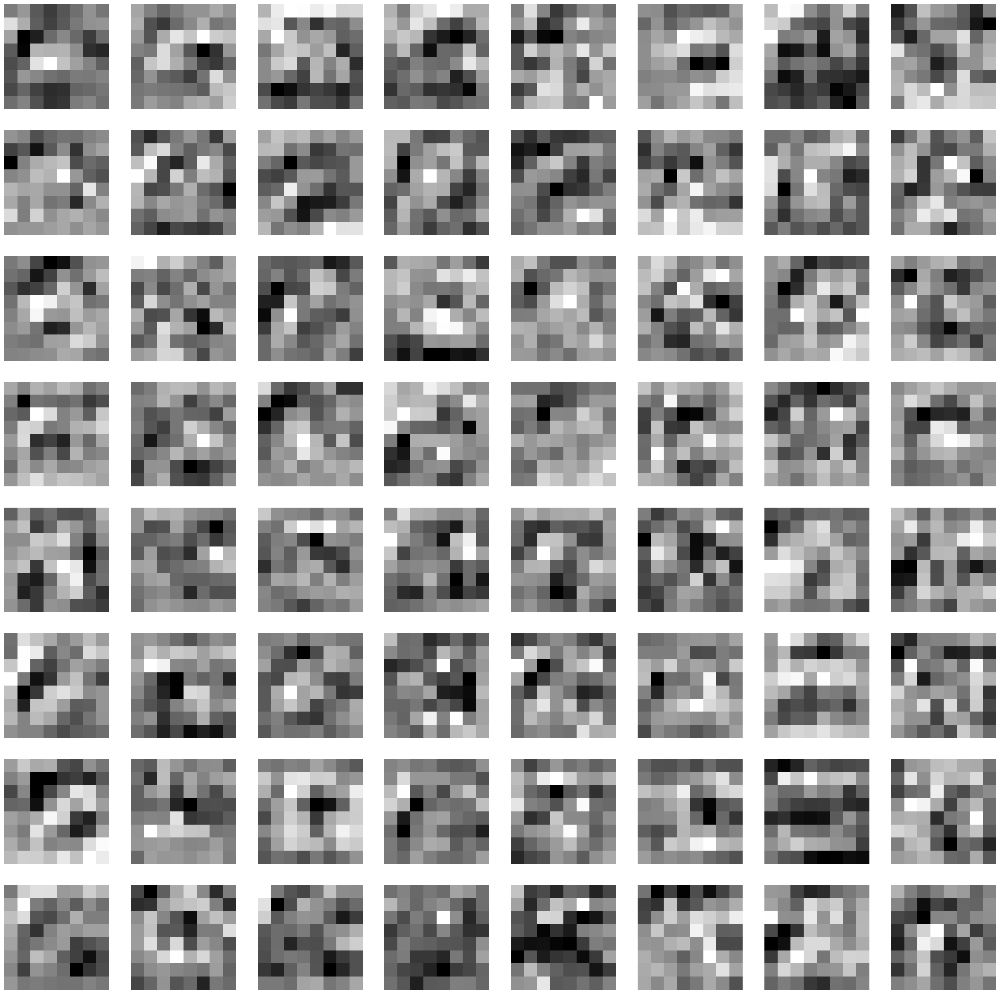

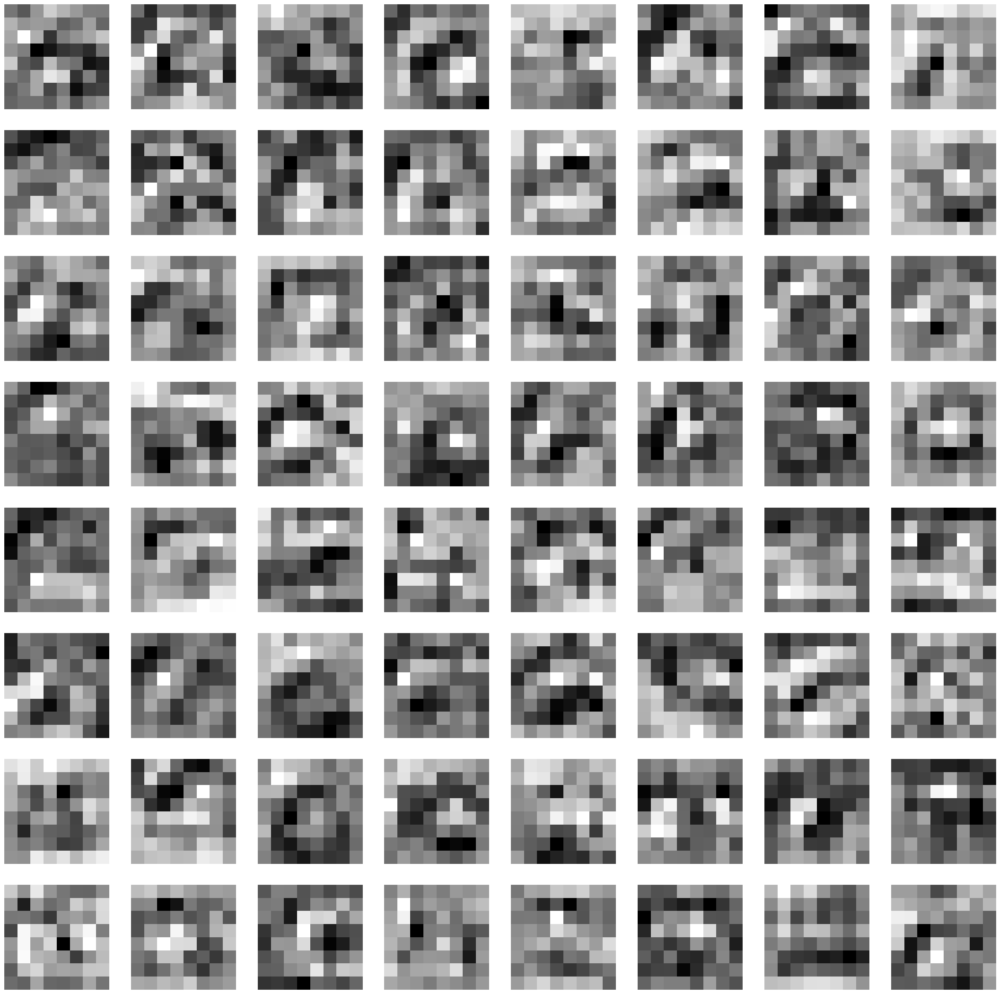

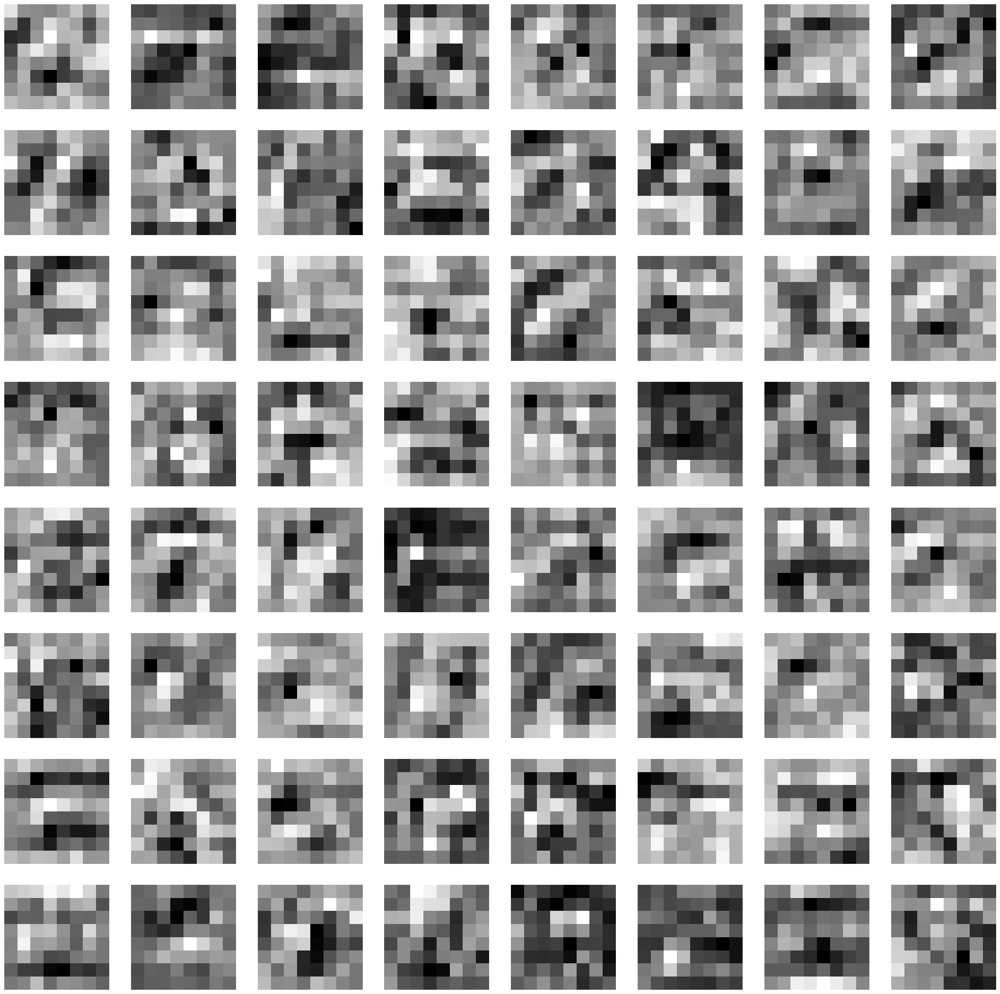

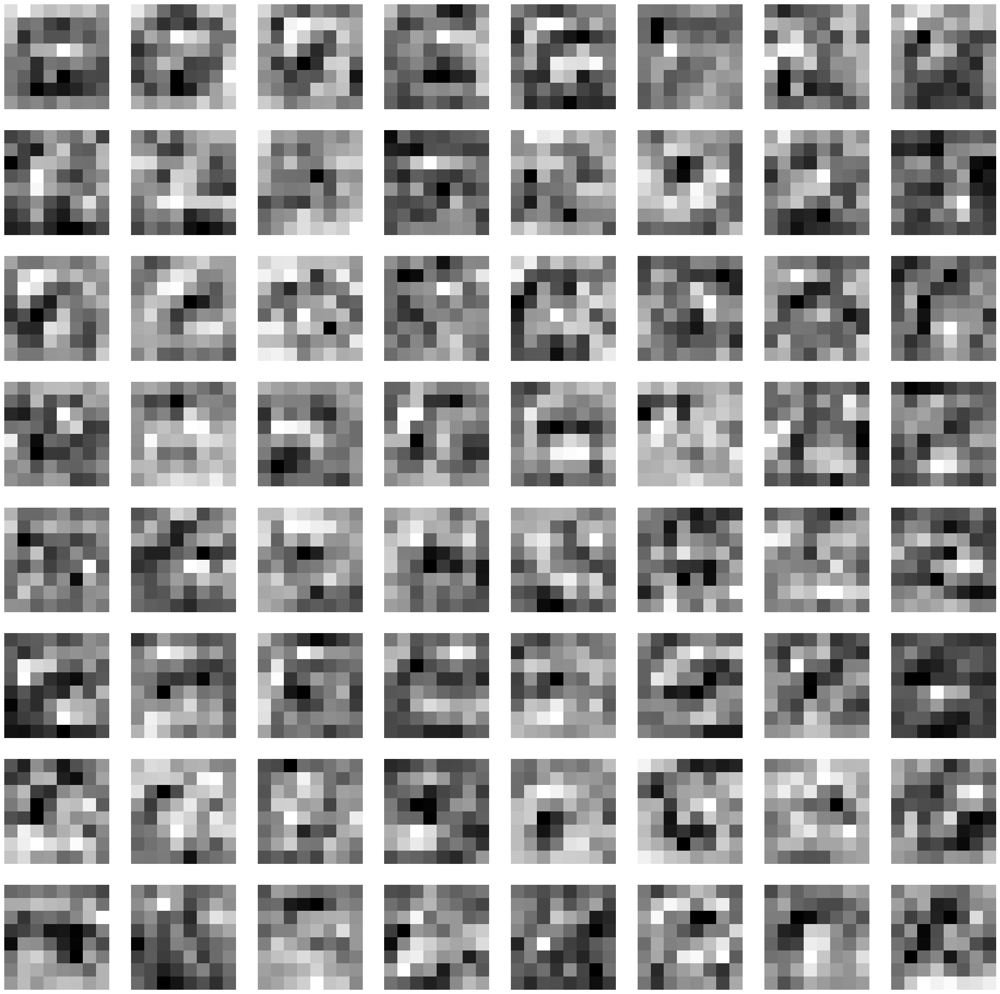

In [ ]:
# Importing libraries
import torch
import matplotlib.pyplot as plt
import torchvision.transforms as t
import cv2 as cv
import torchvision.models as models
# Importing the module
# from extractor import Extractor
from google.colab import files
from PIL import Image


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# Loading the model
resnet = models.resnet50()

extractor = Extractor(list(resnet.children()))
extractor.activate()


# Visualising the filters
plt.figure(figsize=(35, 35))
for index, filter in enumerate(extractor.CNN_weights[0]):
    plt.subplot(8, 8, index + 1)
    plt.imshow(filter[0, :, :].detach(), cmap='gray')
    plt.axis('off')

plt.show()


# Filter Map
# img = cv.cvtColor(cv.imread('Featuremaps&Filters/img.png'), cv.COLOR_BGR2RGB)

# Load the image
img = Image.open(str("/content/bubaru.jpg")) # add your image path
img = t.Compose([
    # t.ToPILImage(),
    t.Resize((128, 128)),
    # t.Grayscale(),
    t.ToTensor(),
    t.Normalize(0.5, 0.5)])(img).unsqueeze(0)

featuremaps = [extractor.CNN_layers[0](img)]
for x in range(1, len(extractor.CNN_layers)):
    featuremaps.append(extractor.CNN_layers[x](featuremaps[-1]))

# Visualising the featuremaps
for x in range(len(featuremaps)):
    plt.figure(figsize=(30, 30))
    layers = featuremaps[x][0, :, :, :].detach()
    for i, filter in enumerate(layers):
        if i == 64:
            break
        plt.subplot(8, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis('off')

    # plt.savefig('featuremap%s.png'%(x))

plt.show()